<a href="https://colab.research.google.com/github/niconielsen32/NeuralNetworks/blob/main/MugDetector.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# plastic waste Detector with YOLOv5

## Setup

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 17483 (delta 79), reused 30 (delta 30), pack-reused 17374 (from 4)
Receiving objects: 100% (17483/17483), 16.39 MiB | 26.76 MiB/s, done.
Resolving deltas: 100% (11984/11984), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.0 MB/s

In [ ]:
# set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

## Get dataset from Roboflow

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="KDjYFp4DRHKsKPIDjwJ9",model_format='yolov5',notebook='ultralytics')
project = rf.workspace("brawijaya-university-fyh8y").project("plastic-waste-detection-x8dvc")
version = project.version(3)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/Plastic-Waste-Detection-3 in yolov5pytorch:: 100%|██████████| 12012/12012 [00:01<00:00, 6320.80it/s]


## Train The Yolo Model








In [ ]:
!python train.py --img 416 --batch 16 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5l.pt --cache

Streaming output truncated to the last 5000 lines.
  with torch.cuda.amp.autocast(amp):
        0/9       4.7G     0.0679    0.02001    0.04332         36        416:  62% 163/263 [00:59<00:30,  3.31it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        0/9       4.7G    0.06777    0.01999    0.04324         42        416:  62% 164/263 [00:59<00:30,  3.24it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
        0/9       4.7G     0.0676    0.01995    0.04312         28        416:  63% 165/263 [00:59<00:29,  3.33it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(

## Show Training Results

In [ ]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Prediction

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/Plastic-Waste-Detection-3/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 267 layers, 46135203 parameters, 0 gradients, 107.7 GFLOPs
image 1/1200 /content/datasets/Plastic-Waste-Detection-3/valid/images/bottle-1-_jpg.rf.308ba728b1d0cc0ba67cd9adc3328839.jpg: 416x416 1 plastic bottle, 28.1ms
image 2/1200 /content/datasets/Plastic-Waste-Detection-3/valid/images/bottle-101-_jpg.rf.7b6d04f24e041c7d39c9d89484024

## Display Inference Images

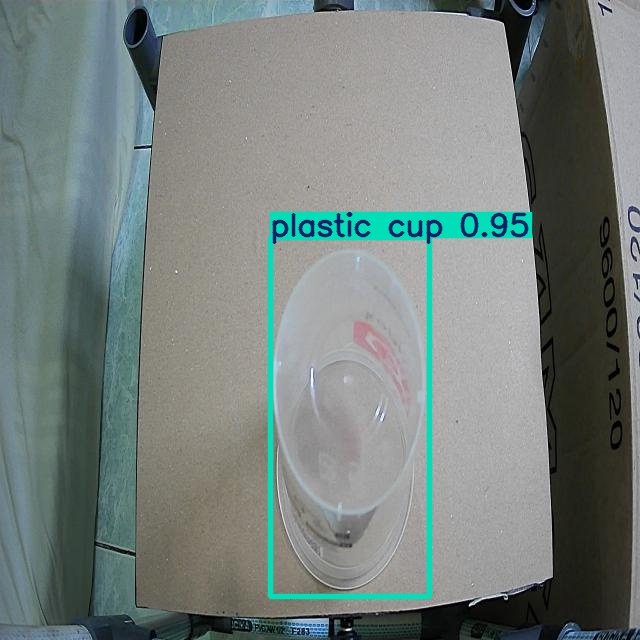

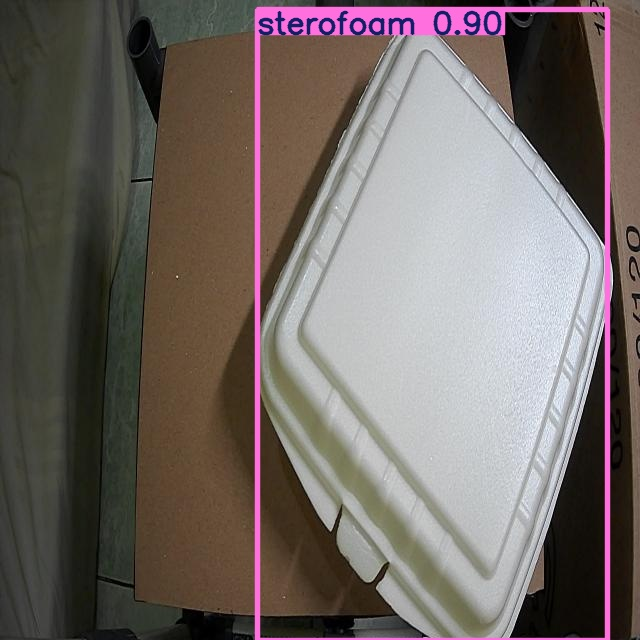

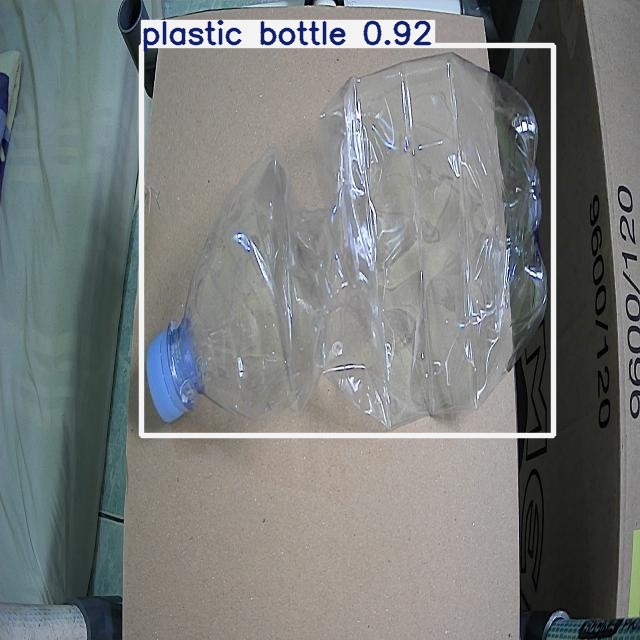

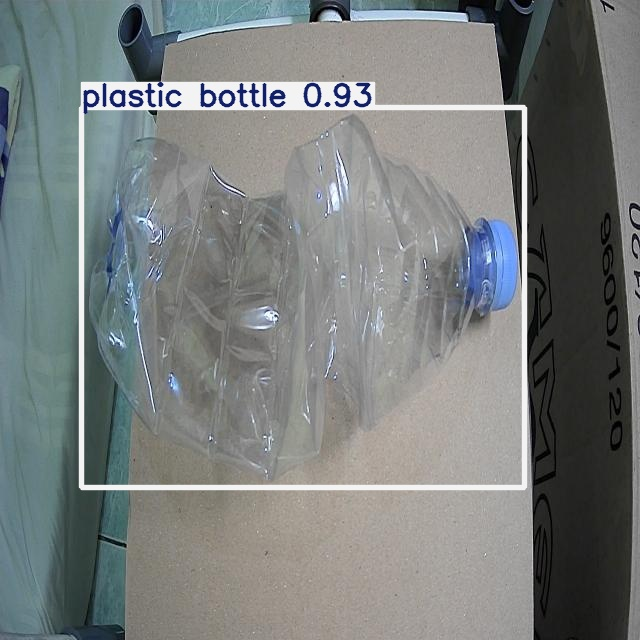

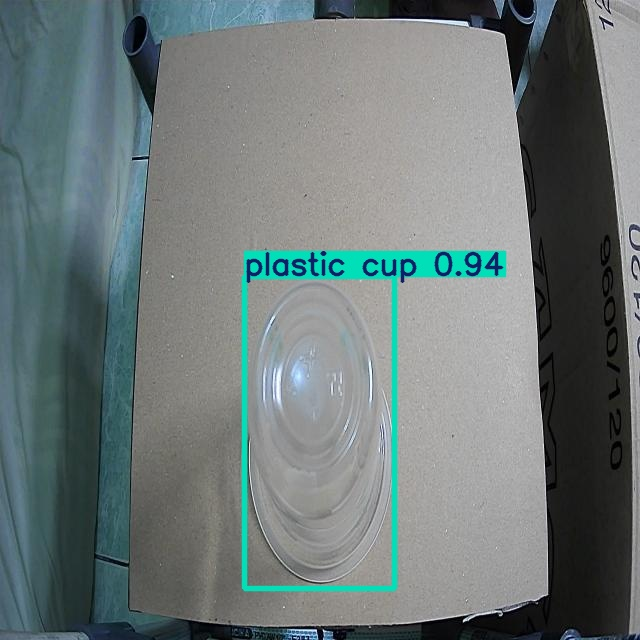

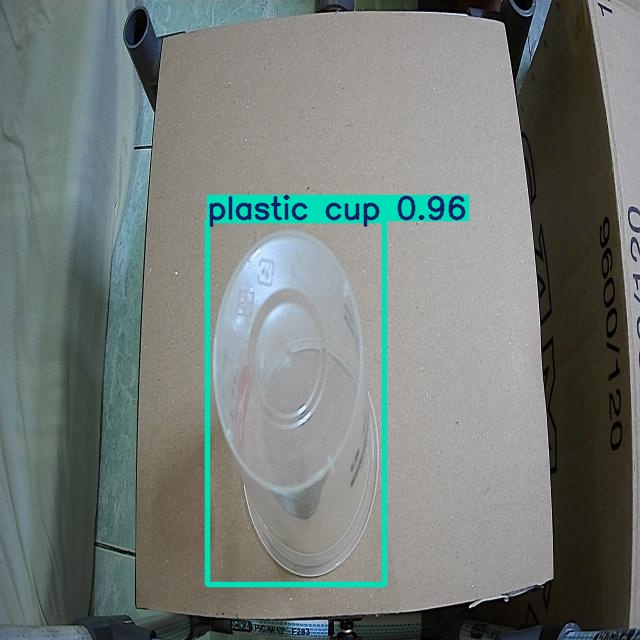

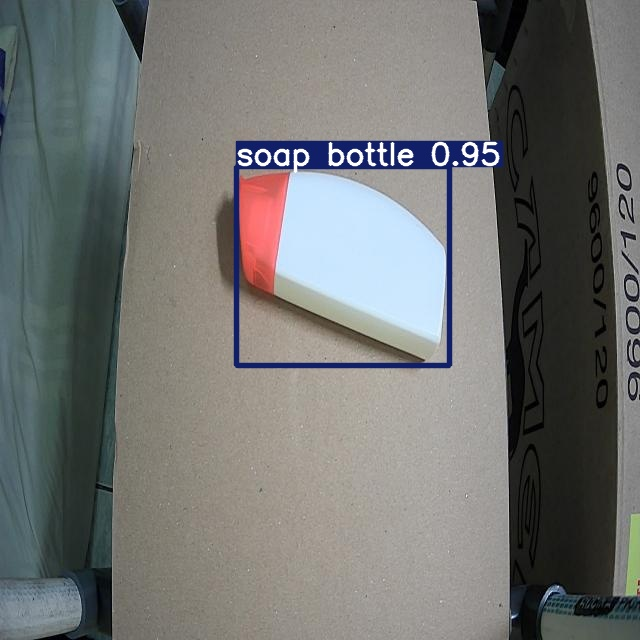

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

i = 0
# Choose the correct exp folder - see prev output block
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    i += 1

    if i < 8:
      display(Image(filename=imageName))
      print("\n")

## Save Model

In [ ]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#
# based on: https://colab.research.google.com/notebooks/snippets/advanced_outputs.ipynb#scrollTo=2viqYx97hPMi
#

from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import numpy as np

def init_camera():
  """Create objects and functions in HTML/JavaScript to access local web camera"""

  js = Javascript('''

    // global variables to use in both functions
    var div = null;
    var video = null;   // <video> to display stream from local webcam
    var stream = null;  // stream from local webcam
    var canvas = null;  // <canvas> for single frame from <video> and convert frame to JPG
    var img = null;     // <img> to display JPG after processing with `cv2`

    async function initCamera() {
      // place for video (and eventually buttons)
      div = document.createElement('div');
      document.body.appendChild(div);

      // <video> to display video
      video = document.createElement('video');
      video.style.display = 'block';
      div.appendChild(video);

      // get webcam stream and assing to <video>
      stream = await navigator.mediaDevices.getUserMedia({video: true});
      video.srcObject = stream;

      // start playing stream from webcam in <video>
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // <canvas> for frame from <video>
      canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      //div.appendChild(input_canvas); // there is no need to display to get image (but you can display it for test)

      // <img> for image after processing with `cv2`
      img = document.createElement('img');
      img.width = video.videoWidth;
      img.height = video.videoHeight;
      div.appendChild(img);
    }

    async function takeImage(quality) {
      // draw frame from <video> on <canvas>
      canvas.getContext('2d').drawImage(video, 0, 0);

      // stop webcam stream
      //stream.getVideoTracks()[0].stop();

      // get data from <canvas> as JPG image decoded base64 and with header "data:image/jpg;base64,"
      return canvas.toDataURL('image/jpeg', quality);
      //return canvas.toDataURL('image/png', quality);
    }

    async function showImage(image) {
      // it needs string "data:image/jpg;base64,JPG-DATA-ENCODED-BASE64"
      // it will replace previous image in `<img src="">`
      img.src = image;
      // TODO: create <img> if doesn't exists,
      // TODO: use `id` to use different `<img>` for different image - like `name` in `cv2.imshow(name, image)`
    }

  ''')

  display(js)
  eval_js('initCamera()')

def take_frame(quality=0.8):
  """Get frame from web camera"""

  data = eval_js('takeImage({})'.format(quality))  # run JavaScript code to get image (JPG as string base64) from <canvas>

  header, data = data.split(',')  # split header ("data:image/jpg;base64,") and base64 data (JPG)
  data = b64decode(data)  # decode base64
  data = np.frombuffer(data, dtype=np.uint8)  # create numpy array with JPG data

  img = cv2.imdecode(data, cv2.IMREAD_UNCHANGED)  # uncompress JPG data to array of pixels

  return img

def show_frame(img, quality=0.8):
  """Put frame as <img src="data:image/jpg;base64,...."> """

  ret, data = cv2.imencode('.jpg', img)  # compress array of pixels to JPG data

  data = b64encode(data)  # encode base64
  data = data.decode()  # convert bytes to string
  data = 'data:image/jpg;base64,' + data  # join header ("data:image/jpg;base64,") and base64 data (JPG)

  eval_js('showImage("{}")'.format(data))  # run JavaScript code to put image (JPG as string base64) in <img>
                                           # argument in `sh


In [ ]:
# import cv2
# import torch
# import numpy as np
# from IPython.display import display, Javascript
# from google.colab.output import eval_js
# from base64 import b64decode, b64encode

# # Load YOLOv5 model with the exported weights
# model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt')

# def init_camera():
#     """Create objects and functions in HTML/JavaScript to access local web camera"""

#     js = Javascript('''

#     // global variables to use in both functions
#     var div = null;
#     var video = null;   // <video> to display stream from local webcam
#     var stream = null;  // stream from local webcam
#     var canvas = null;  // <canvas> for single frame from <video> and convert frame to JPG
#     var img = null;     // <img> to display JPG after processing with `cv2`

#     async function initCamera() {
#         // place for video (and eventually buttons)
#         div = document.createElement('div');
#         document.body.appendChild(div);

#         // <video> to display video
#         video = document.createElement('video');
#         video.style.display = 'block';
#         div.appendChild(video);

#         // get webcam stream and assign to <video>
#         stream = await navigator.mediaDevices.getUserMedia({video: true});
#         video.srcObject = stream;

#         // start playing stream from webcam in <video>
#         await video.play();

#         // Resize the output to fit the video element.
#         google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

#         // <canvas> for frame from <video>
#         canvas = document.createElement('canvas');
#         canvas.width = video.videoWidth;
#         canvas.height = video.videoHeight;
#         //div.appendChild(input_canvas); // there is no need to display to get image (but you can display it for test)

#         // <img> for image after processing with `cv2`
#         img = document.createElement('img');
#         img.width = video.videoWidth;
#         img.height = video.videoHeight;
#         div.appendChild(img);
#     }

#     async function takeImage(quality) {
#         // draw frame from <video> on <canvas>
#         canvas.getContext('2d').drawImage(video, 0, 0);

#         // get data from <canvas> as JPG image decoded base64 and with header "data:image/jpg;base64,"
#         return canvas.toDataURL('image/jpeg', quality);
#     }

#     async function showImage(image) {
#         // it needs string "data:image/jpg;base64,JPG-DATA-ENCODED-BASE64"
#         // it will replace the previous image in `<img src="">`
#         img.src = image;
#     }

#     ''')

#     display(js)
#     eval_js('initCamera()')

# def take_frame(quality=0.8):
#     """Get frame from web camera"""

#     data = eval_js('takeImage({})'.format(quality))  # run JavaScript code to get image (JPG as string base64) from <canvas>

#     header, data = data.split(',')  # split header ("data:image/jpg;base64,") and base64 data (JPG)
#     data = b64decode(data)  # decode base64
#     data = np.frombuffer(data, dtype=np.uint8)  # create numpy array with JPG data

#     img = cv2.imdecode(data, cv2.IMREAD_UNCHANGED)  # uncompress JPG data to an array of pixels

#     return img

# def draw_boxes(image, results):
#     """Draw bounding boxes and class labels on the image"""

#     for result in results.xyxy[0]:
#         xmin, ymin, xmax, ymax, conf, cls = result
#         print("Coordinates:", xmin, ymin, xmax, ymax)
#         xmin, ymin, xmax, ymax = int(xmin), int(ymin), int(xmax), int(ymax)
#         cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
#         cv2.putText(image, f'{model.names[int(cls)]} {conf:.2f}', (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

#     return image

# # Initialize camera
# init_camera()

# # Perform live camera object detection
# while True:
#     # Take frame from camera
#     frame = take_frame()

#     # Perform inference
#     results = model(frame)

#     # Draw bounding boxes on frame
#     frame_with_boxes = draw_boxes(frame.copy(), results)

#     # Display frame with bounding boxes
#     show_frame(frame_with_boxes)

#     # Break the loop when 'q' is pressed
#     if cv2.waitKey(1) & 0xFF == ord('q'):
#         break
# # Release camera and close all windows
# cv2.destroyAllWindows()


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2025-5-23 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 267 layers, 46135203 parameters, 0 gradients, 107.7 GFLOPs
Adding AutoShape... 


<IPython.core.display.Javascript object>

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


error: OpenCV(4.10.0) /io/opencv/modules/highgui/src/window.cpp:1367: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvWaitKey'


In [ ]:

# Imports
import cv2
import torch
import numpy as np
import time
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode, b64encode

# Load YOLOv5 model (your custom model)
model = torch.hub.load('ultralytics/yolov5', 'custom', path='/content/drive/MyDrive/best.pt', force_reload=True)

# JavaScript for initializing webcam and handling frame/image display
js_code = Javascript('''
    var div = null;
    var video = null;
    var stream = null;
    var canvas = null;
    var img = null;

    async function initCamera() {
        div = document.createElement('div');
        document.body.appendChild(div);

        video = document.createElement('video');
        video.style.display = 'block';
        div.appendChild(video);

        stream = await navigator.mediaDevices.getUserMedia({video: true});
        video.srcObject = stream;
        await video.play();

        google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

        canvas = document.createElement('canvas');
        canvas.width = video.videoWidth;
        canvas.height = video.videoHeight;

        img = document.createElement('img');
        img.width = video.videoWidth;
        img.height = video.videoHeight;
        div.appendChild(img);
    }

    async function takeImage(quality) {
        canvas.getContext('2d').drawImage(video, 0, 0);
        return canvas.toDataURL('image/jpeg', quality);
    }

    async function showImage(image) {
        img.src = image;
    }
''')

# Display JavaScript
display(js_code)
eval_js("initCamera()")

# Function to capture a single frame from webcam
def take_frame(quality=0.8):
    data = eval_js(f"takeImage({quality})")
    header, data = data.split(',')
    img_data = b64decode(data)
    np_data = np.frombuffer(img_data, dtype=np.uint8)
    frame = cv2.imdecode(np_data, cv2.IMREAD_COLOR)
    return frame

# Function to show image inline in the notebook
def show_frame(frame):
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    _, jpg = cv2.imencode('.jpg', frame_rgb)
    jpg_b64 = b64encode(jpg.tobytes()).decode()
    display_url = f"data:image/jpeg;base64,{jpg_b64}"
    eval_js(f'showImage("{display_url}")')


# Function to draw bounding boxes on frame
def draw_boxes(image, results):
    for result in results.xyxy[0]:
        xmin, ymin, xmax, ymax, conf, cls = result
        xmin, ymin, xmax, ymax = int(xmin), int(ymin), int(xmax), int(ymax)
        label = f"{model.names[int(cls)]} {conf:.2f}"
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(image, label, (xmin, ymin - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    return image

# Main detection loop
try:
    print("Starting detection... Press the stop button to end.")
    while True:
        frame = take_frame()
        results = model(frame)
        processed_frame = draw_boxes(frame.copy(), results)
        show_frame(processed_frame)
        time.sleep(0.05)  # Small delay to reduce resource usage
except KeyboardInterrupt:
    print("Stopped.")


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2025-5-23 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 267 layers, 46135203 parameters, 0 gradients, 107.7 GFLOPs
Adding AutoShape... 


<IPython.core.display.Javascript object>

Starting detection... Press the stop button to end.


`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
`torch.cuda.amp.autocast(arg

Stopped.


`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
